##Train data loading

In [ ]:
!pip install xarray netcdf4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.0 MB/s eta 0:00:00


In [ ]:
import xarray as xr
import glob
import os
import requests
from bs4 import BeautifulSoup

# Corrected URL containing the directory with NetCDF files
url = "https://portal.nersc.gov/project/ClimateNet/climatenet_new/train/"

# Get HTML content from the URL
response = requests.get(url)
if response.status_code == 200:
    soup = BeautifulSoup(response.content, 'html.parser')

    # Find all 'a' tags (links) in the HTML content
    links = soup.find_all('a')

    # Filter out links ending with '.nc' (NetCDF files)
    file_links = [link.get('href') for link in links if link.get('href').endswith('.nc')]

    # Download each NetCDF file
    for file_link in file_links:
        filename = os.path.basename(file_link)
        with open(filename, 'wb') as f:
            f.write(requests.get(url + file_link).content)

# Get a list of all downloaded NetCDF files
file_list = glob.glob('*.nc')

# Read all NetCDF files into a single Dataset
ds = xr.open_mfdataset(file_list, combine='by_coords')

# Inspect the dataset
print(ds)


<xarray.Dataset>
Dimensions:  (lat: 768, lon: 1152, time: 188)
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 'data-1996-06-09-01-1.nc' ... 'data-2010-10-29-01-...
Data variables: (12/17)
    TMQ      (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    U850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    V850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    UBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    VBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    QREFHT   (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    ...       ...
    TS       (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>

In [ ]:
ds.info()

In [ ]:
import xarray as xr
import pandas as pd

min_lat, max_lat = 17, 22
min_lon, max_lon = 81, 87

# Select data within the specified region
region_data = ds.sel(lat=slice(min_lat, max_lat), lon=slice(min_lon, max_lon))

# Convert the selected data to a pandas DataFrame
df = region_data.to_dataframe()
df.head(5)

In [ ]:
df.shape

##EDA

In [ ]:
# EDA
# numerical data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

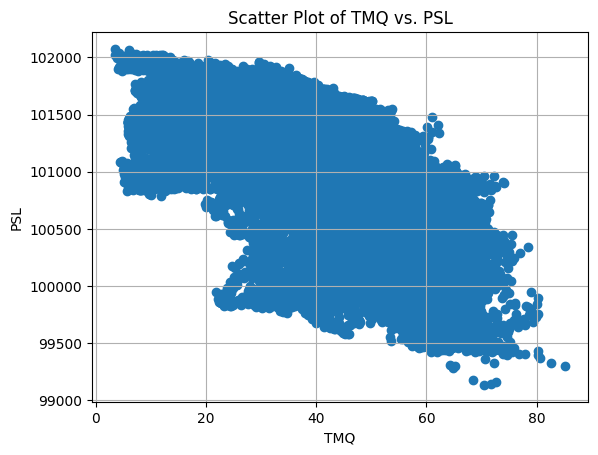

In [ ]:
import matplotlib.pyplot as plt



plt.scatter(df['TMQ'], df['PSL'])
plt.xlabel('TMQ')  # Label for x-axis
plt.ylabel('PSL')  # Label for y-axis
plt.title('Scatter Plot of TMQ vs. PSL')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()


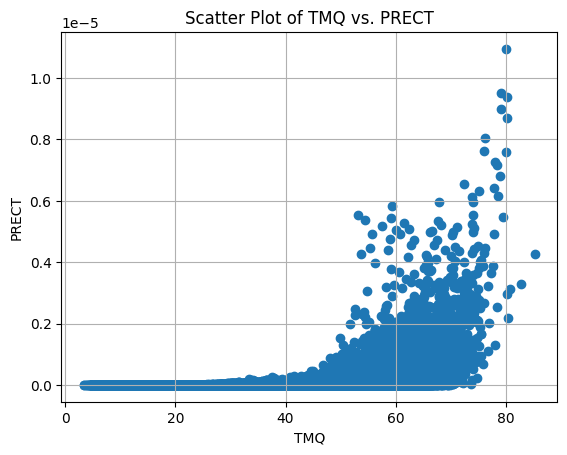

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your pandas DataFrame containing the data
# Replace 'TMQ' and 'PSL' with your actual column names if different

plt.scatter(df['TMQ'], df['PRECT'])
plt.xlabel('TMQ')  # Label for x-axis
plt.ylabel('PRECT')  # Label for y-axis
plt.title('Scatter Plot of TMQ vs. PRECT')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()

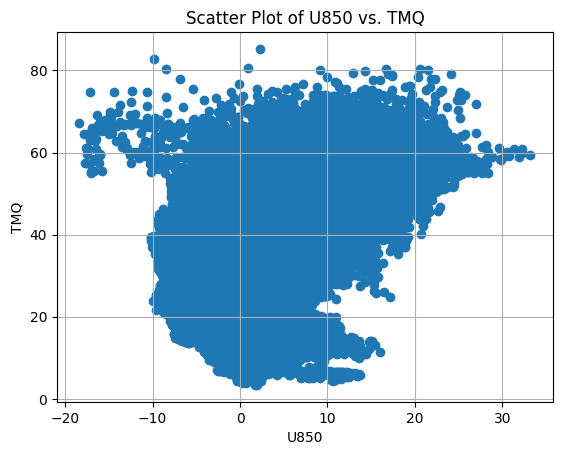

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your pandas DataFrame containing the data
# Replace 'TMQ' and 'PSL' with your actual column names if different

plt.scatter(df['U850'], df['TMQ'])
plt.xlabel('U850')  # Label for x-axis
plt.ylabel('TMQ')  # Label for y-axis
plt.title('Scatter Plot of U850 vs. TMQ')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()

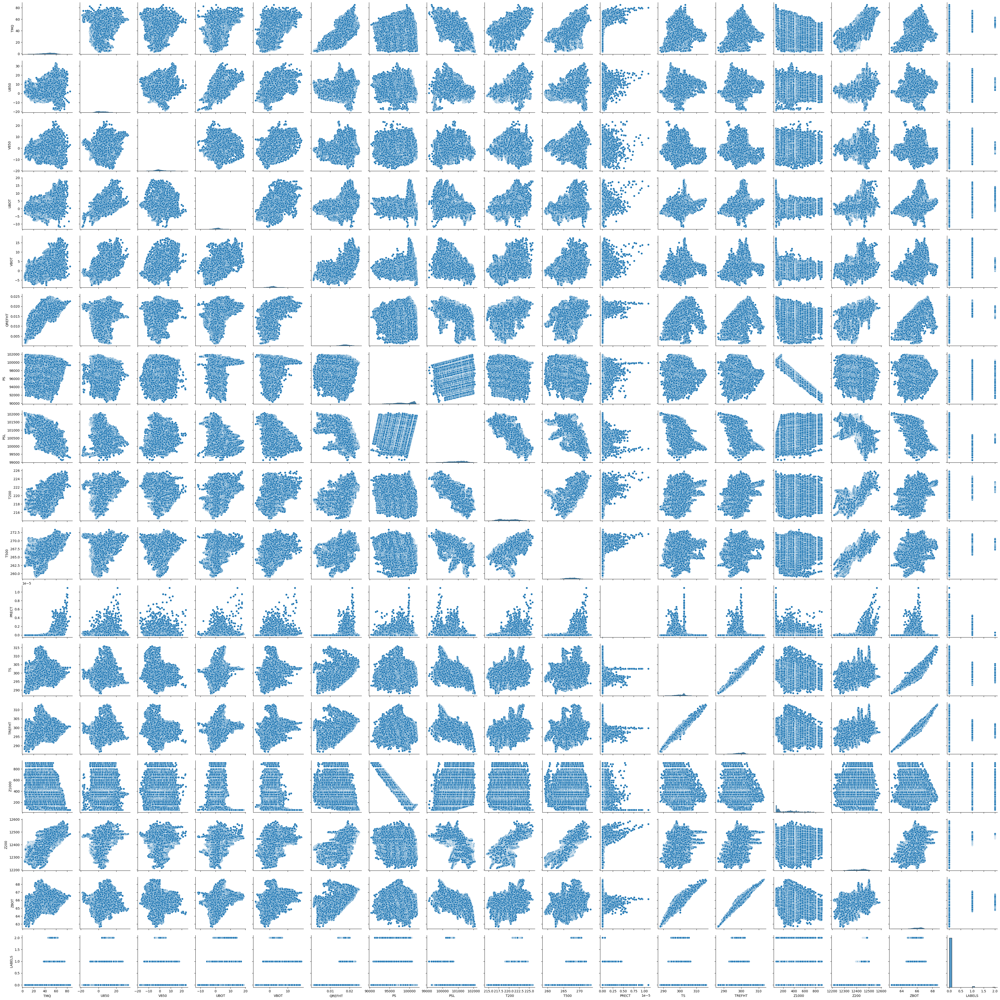

In [ ]:
import seaborn as sns
sns.pairplot(df)

<ipython-input-11-e5a7bf605db9>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


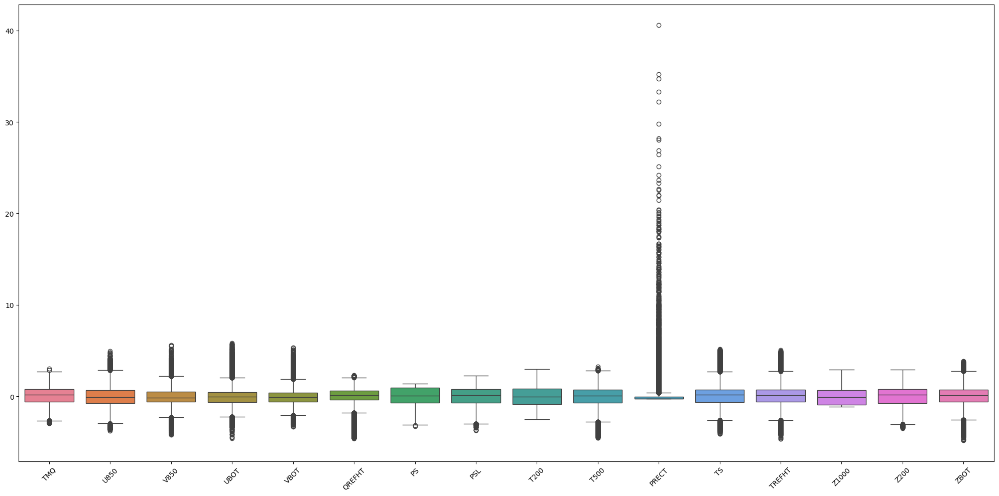

In [ ]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


scaler = StandardScaler()
df_standardized = scaler.fit_transform(df)
df_standardized = pd.DataFrame(df_standardized, columns=df.columns)
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=df_standardized.iloc[:,:16])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-12-fae490e97f7e>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


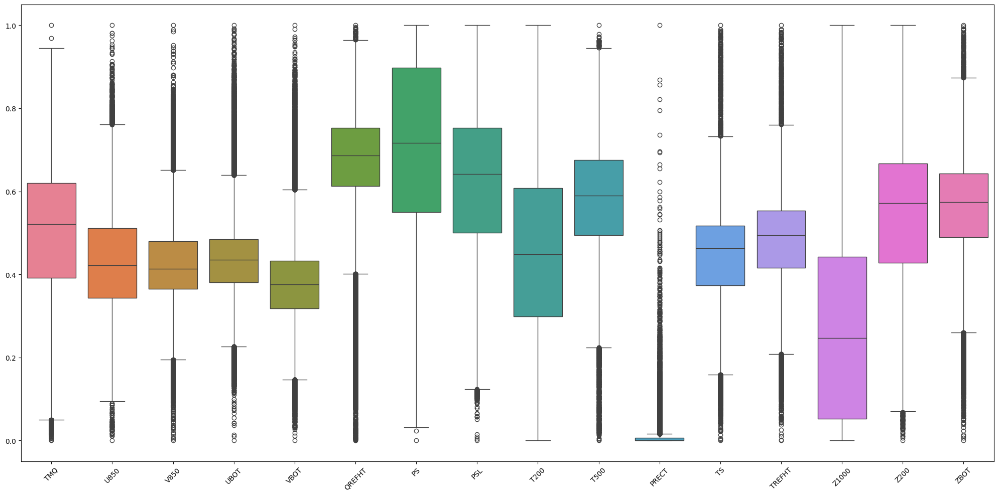

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler1 = MinMaxScaler()
df_standardized1 = scaler1.fit_transform(df)
df_standardized1= pd.DataFrame(df_standardized1, columns=df.columns)
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=df_standardized1.iloc[:,:16])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

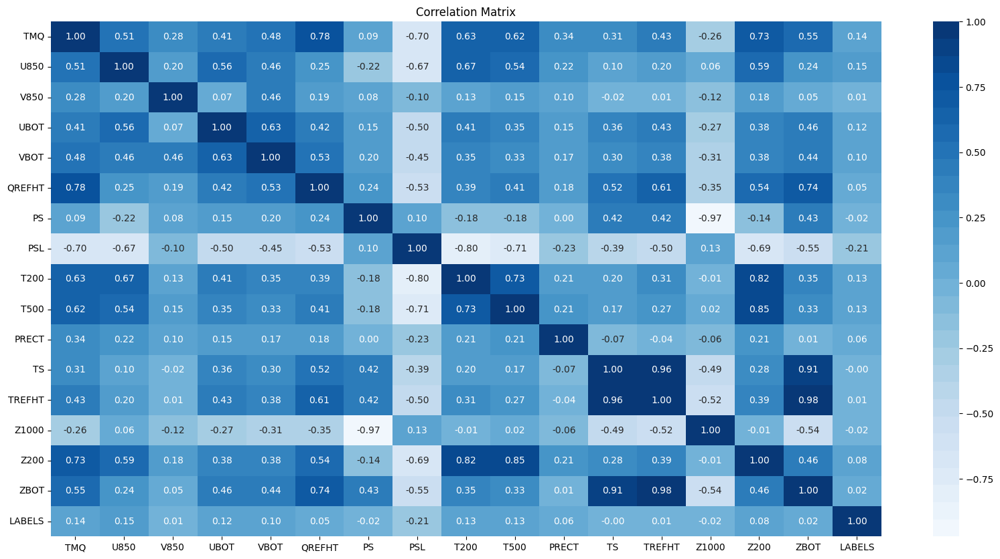

In [ ]:
plt.figure(figsize=(20,10))
blue_palette = sns.color_palette("Blues", 30)
sns.heatmap(df.corr(),annot=True,cmap=blue_palette,fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

##Loading Test data

In [ ]:
import xarray as xr
import glob
import os
import requests
from bs4 import BeautifulSoup

# Corrected URL containing the directory with NetCDF files
url = "https://portal.nersc.gov/project/ClimateNet/climatenet_new/test/"

# Get HTML content from the URL
response = requests.get(url)
if response.status_code == 200:
    soup = BeautifulSoup(response.content, 'html.parser')

    # Find all 'a' tags (links) in the HTML content
    links = soup.find_all('a')

    # Filter out links ending with '.nc' (NetCDF files)
    file_links = [link.get('href') for link in links if link.get('href').endswith('.nc')]

    # Download each NetCDF file
    for file_link in file_links:
        filename = os.path.basename(file_link)
        with open(filename, 'wb') as f:
            f.write(requests.get(url + file_link).content)

# Get a list of all downloaded NetCDF files
file_list = glob.glob('*.nc')

# Read all NetCDF files into a single Dataset
ds_1= xr.open_mfdataset(file_list, combine='by_coords')

# Inspect the dataset
print(ds_1)

<xarray.Dataset>
Dimensions:  (lat: 768, lon: 1152, time: 219)
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 'data-1996-06-09-01-1.nc' ... 'data-2013-09-27-01-...
Data variables: (12/17)
    TMQ      (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    U850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    V850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    UBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    VBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    QREFHT   (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    ...       ...
    TS       (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>

In [ ]:
import xarray as xr
import pandas as pd

min_lat, max_lat = 17, 22
min_lon, max_lon = 81, 87

# Select data within the specified region
region_data_test = ds_1.sel(lat=slice(min_lat, max_lat), lon=slice(min_lon, max_lon))

# Convert the selected data to a pandas DataFrame
df_test = region_data_test.to_dataframe()
df_test.head(5)

TMQ       U850       V850  \
lat       lon   time                                                       
17.014342 81.25 data-1996-06-09-01-1.nc  56.342190  13.036339 -10.293732   
                data-1996-07-11-01-1.nc  54.572144   6.471002  -4.286693   
                data-1996-07-18-01-1.nc  56.386250   8.983348  -3.408289   
                data-1996-09-01-01-1.nc  49.161888   1.671357  -1.645652   
                data-1996-09-12-01-1.nc  47.865036   0.990558  -2.492369   

                                             UBOT      VBOT    QREFHT  \
lat       lon   time                                                    
17.014342 81.25 data-1996-06-09-01-1.nc  5.163282  1.757134  0.014044   
                data-1996-07-11-01-1.nc  0.751915  2.730992  0.018259   
                data-1996-07-18-01-1.nc  3.335202 -0.492403  0.017492   
                data-1996-09-01-01-1.nc -0.064215  2.706687  0.019010   
                data-1996-09-12-01-1.nc -0.372562  2.532423  0.018988   

                                                   PS            PSL  \
lat       lon   time                                                   
17.014342 81.25 data-1996-06-09-01-1.nc  99267.078125  100622.320312   
                data-1996-07-11-01-1.nc  99228.250000  100583.687500   
                data-1996-07-18-01-1.nc  98984.671875  100341.890625   
                data-1996-09-01-01-1.nc  99663.593750  101026.070312   
                data-1996-09-12-01-1.nc  99696.109375  101057.148438   

                                               T200        T500         PRECT  \
lat       lon   time                                                            
17.014342 81.25 data-1996-06-09-01-1.nc  221.407074  267.710724 -2.512136e-23   
                data-1996-07-11-01-1.nc  219.473907  267.540283  3.002336e-08   
                data-1996-07-18-01-1.nc  219.912170  267.923157  5.138599e-13   
                data-1996-09-01-01-1.nc  219.870575  266.537476  3.122263e-09   
                data-1996-09-12-01-1.nc  219.010010  267.386353  3.159062e-08   

                                                 TS      TREFHT       Z1000  \
lat       lon   time                                                          
17.014342 81.25 data-1996-06-09-01-1.nc  297.925079  298.589691  182.938248   
                data-1996-07-11-01-1.nc  299.875214  299.240509  183.057129   
                data-1996-07-18-01-1.nc  297.163300  296.923767  182.543884   
                data-1996-09-01-01-1.nc  299.967285  298.881561  182.983505   
                data-1996-09-12-01-1.nc  300.852051  299.742218  183.164413   

                                                 Z200       ZBOT  LABELS  
lat       lon   time                                                      
17.014342 81.25 data-1996-06-09-01-1.nc  12431.243164  65.922676       0  
                data-1996-07-11-01-1.nc  12394.581055  66.041550       0  
                data-1996-07-18-01-1.nc  12387.177734  65.528305       0  
                data-1996-09-01-01-1.nc  12406.737305  65.967918       0  
                data-1996-09-12-01-1.nc  12419.861328  66.148827       0

In [ ]:
df_test.shape

(91542, 17)